**Implementation for Task 1 using sirs broilerplate code as a template**

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import tensorflow as tf  
import pandas as pd
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
import seaborn as sns
from sklearn.utils.multiclass import unique_labels
import sklearn

In [8]:
import os

# Load and preprocess the data
data = []  # List to store image data
labels = []  # List to store labels

# Define a function to extract the person label from the file name
def extract_person_label(file_name):
    return int(file_name.split('.')[0].replace('subject', '')) - 1  # Subtract 1 to make labels start from 0

# Load data and labels
# Assuming the dataset files are in the 'dataset' directory
dataset_dir = 'D:/FAST_NUCES/7thSemester/DLP/Assignment/Assignment1/Dataset/yale'

for file_name in os.listdir(dataset_dir):
    img = plt.imread(os.path.join(dataset_dir, file_name))
    # print(img.shape)
    data.append(img.flatten())  # Flatten image into a 1D array
    labels.append(extract_person_label(file_name))

data = np.array(data)
labels = np.array(labels)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)


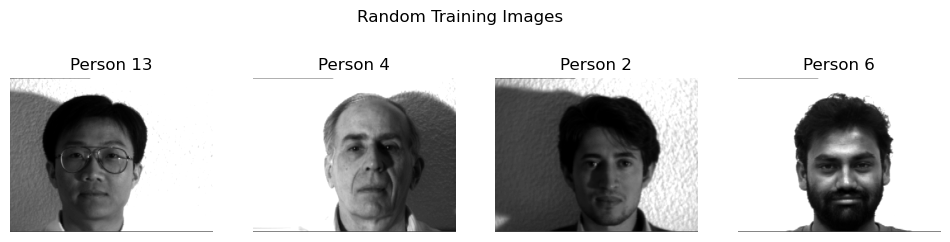

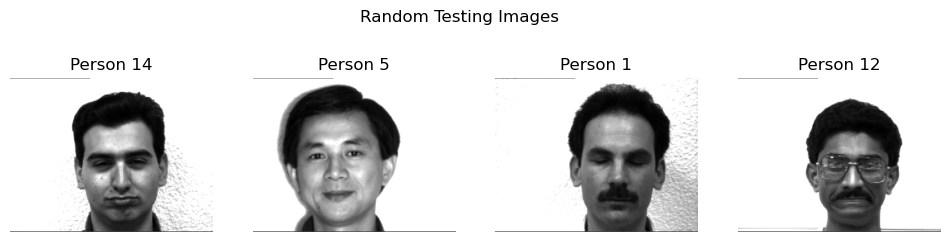

In [9]:
import random

# Randomly select four indices from the training dataset
train_indices = random.sample(range(len(X_train)), 4)

# Randomly select four indices from the testing dataset
test_indices = random.sample(range(len(X_test)), 4)

# Function to display images
def display_images(images, labels, title):
    plt.figure(figsize=(12, 3))
    plt.suptitle(title)
    for i, (image, label) in enumerate(zip(images, labels), 1):
        plt.subplot(1, 4, i)
        plt.imshow(image.reshape((243, 320)), cmap='gray')
        plt.title(f"Person {label}")
        plt.axis('off')
    plt.show()

# Display four random training images
train_images_to_display = X_train[train_indices]
train_labels_to_display = y_train[train_indices]
display_images(train_images_to_display, train_labels_to_display, "Random Training Images")

# Display four random testing images
test_images_to_display = X_test[test_indices]
test_labels_to_display = y_test[test_indices]
display_images(test_images_to_display, test_labels_to_display, "Random Testing Images")

In [16]:
# Import Keras modules
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD

# Define a function that creates a Keras model
def create_model(neurons_per_layer=10, hidden_layers=1, activation_function='relu', learning_rate=0.01, momentum=0.9):
    # Create a Sequential model
    model = tf.keras.Sequential()
    # Add an input layer with the same shape as the input data

    model.add(tf.keras.layers.Input(shape=(X_train.shape[1],)))
    # Add hidden layers with the given number of neurons and activation function
    for i in range(hidden_layers):
        model.add(tf.keras.layers.Dense(neurons_per_layer, activation=activation_function))
    # Add an output layer with one neuron and sigmoid activation for multiclass classification
    model.add(tf.keras.layers.Dense(15, activation='softmax'))
    # Create an optimizer with the given learning rate and momentum
    #optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    #that parts an SGD req only
    # Compile the model with binary crossentropy loss and accuracy metric
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    # Return the model
    return model


**My Own Code Follows This Point Onwards**

In [ ]:
# Define a function to create the MLP model
def create_mlp_model(hidden_layers, neurons_per_layer, activation_function):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Input(shape=(X_train.shape[1],)))

    for _ in range(hidden_layers): #reminder to self _ means we dont expect the variable itself to be used in the loop.
        model.add(tf.keras.layers.Dense(neurons_per_layer, activation=activation_function))

    model.add(tf.keras.layers.Dense(15, activation='softmax'))  # 15 output classes for 15 subjects
    
    # Compile the model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [17]:
# Function to train and evaluate the MLP model
def train_evaluate_mlp(neurons_per_layer=20,hidden_layers=3, activation_function='relu', learning_rate=0.01, momentum=0.09, epochs=20, batch_size=32):
    model = create_model(neurons_per_layer, hidden_layers, activation_function, learning_rate, momentum)
    
    
    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2)
    
    # Test the model and calculate evaluation metrics
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    
    accuracy = accuracy_score(y_test, y_pred_classes)
    precision = precision_score(y_test, y_pred_classes, average='macro')
    recall = recall_score(y_test, y_pred_classes, average='macro')
    f1 = f1_score(y_test, y_pred_classes, average='macro')
    
    print(f'Accuracy: {accuracy:.2f}')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1-score: {f1:.2f}')

    return accuracy, precision, recall, f1, history, y_pred_classes


In [18]:
# Experiment 2: With hyperparameter tuning (GridSearchCV)
param_grid = {
    'neurons_per_layer': [32, 64, 128],
    'hidden_layers': [1, 2, 3],
    'activation_function': ['relu', 'sigmoid'],
    'learning_rate': [0.1, 0.01, 0.001],
    'momentum': [0.9, 0.8, 0.7],
    'epochs': [20, 50, 100]
}

# Create an instance of your MLP model
#mlp_model = create_mlp_model(hidden_layers=2, neurons_per_layer=64, activation_function='relu')
#Note to future self- making this instance does not force GridSearchCV to use these settings. It is just a template for the architecture you're using.
#instead it will use the param_grid to find the best settings.
#That didn't work but the logic behind my statements remains the same.

mlp_classifier = KerasClassifier(build_fn=create_model, epochs=100, batch_size=32) 


# Initialize GridSearchCV with the MLP model as the estimator
grid_search = GridSearchCV(estimator=mlp_classifier,
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=3,
                           refit=True)

# Fit the GridSearchCV object
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

accuracy2, precision2, recall2, f1_2, history2, y_pred2 = train_evaluate_mlp(**best_params, epochs=100, batch_size=32)


Epoch 1/20


C:\Users\rahei\AppData\Local\Temp\ipykernel_9676\2011205703.py:17: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  mlp_classifier = KerasClassifier(build_fn=create_model, epochs=100, batch_size=32)


Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20

d:\Anaconda\ActualInstallation\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
1458 fits failed out of a total of 1458.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "d:\Anaconda\ActualInstallation\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\wrappers\scikit_learn.py", line 248, in fit
    return super().fit(x, y, **kwargs)
  File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\wrappers\scikit_learn.py", line 175, in fit
    history = self.model.fit(x, y, **fit_a

InvalidArgumentError: Graph execution error:

Detected at node 'sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits' defined at (most recent call last):
    File "d:\Anaconda\ActualInstallation\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "d:\Anaconda\ActualInstallation\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "d:\Anaconda\ActualInstallation\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
      app.start()
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\kernelapp.py", line 712, in start
      self.io_loop.start()
    File "d:\Anaconda\ActualInstallation\lib\site-packages\tornado\platform\asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "d:\Anaconda\ActualInstallation\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "d:\Anaconda\ActualInstallation\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "d:\Anaconda\ActualInstallation\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\kernelbase.py", line 730, in execute_request
      reply_content = await reply_content
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\ipkernel.py", line 390, in do_execute
      res = shell.run_cell(code, store_history=store_history, silent=silent)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\ipykernel\zmqshell.py", line 528, in run_cell
      return super().run_cell(*args, **kwargs)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\interactiveshell.py", line 2914, in run_cell
      result = self._run_cell(
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\interactiveshell.py", line 2960, in _run_cell
      return runner(coro)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\async_helpers.py", line 78, in _pseudo_sync_runner
      coro.send(None)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\interactiveshell.py", line 3185, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\interactiveshell.py", line 3377, in run_ast_nodes
      if (await self.run_code(code, result,  async_=asy)):
    File "d:\Anaconda\ActualInstallation\lib\site-packages\IPython\core\interactiveshell.py", line 3457, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\rahei\AppData\Local\Temp\ipykernel_9676\2011205703.py", line 28, in <module>
      grid_search.fit(X_train, y_train)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\sklearn\model_selection\_search.py", line 926, in fit
      self.best_estimator_.fit(X, y, **fit_params)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\wrappers\scikit_learn.py", line 248, in fit
      return super().fit(x, y, **kwargs)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\wrappers\scikit_learn.py", line 175, in fit
      history = self.model.fit(x, y, **fit_args)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 994, in train_step
      loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\training.py", line 1052, in compute_loss
      return self.compiled_loss(
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\engine\compile_utils.py", line 265, in __call__
      loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\losses.py", line 152, in __call__
      losses = call_fn(y_true, y_pred)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\losses.py", line 272, in call
      return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\losses.py", line 2084, in sparse_categorical_crossentropy
      return backend.sparse_categorical_crossentropy(
    File "d:\Anaconda\ActualInstallation\lib\site-packages\keras\backend.py", line 5630, in sparse_categorical_crossentropy
      res = tf.nn.sparse_softmax_cross_entropy_with_logits(
Node: 'sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits'
Received a label value of 14 which is outside the valid range of [0, 1).  Label values: 14 6 6 12 9 4 8 3 10 3 5 0 13 5 10 11 6 10 5 1 6 1 8 6 1 5 6 2 3 14 8 13
	 [[{{node sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_train_function_1975315]

In [19]:
#Running Model 1: User Defined Parameters
#Without hyperparameter tuning
accuracy1, precision1, recall1, f1_1, history1,y_pred1 = train_evaluate_mlp(hidden_layers=2, neurons_per_layer=64, activation_function='relu', epochs=100, batch_size=32)



array([ 7,  0,  8,  4,  3,  6, 14,  2, 12, 10,  8, 12,  3,  7,  2, 11,  6,
        8,  1,  5,  7,  0,  2,  6, 12,  3,  3,  0, 12,  2, 13,  9,  6,  0,
        8, 10,  0, 11, 11,  5,  4, 13,  2,  3, 10,  2,  2, 10,  7,  7,  3,
        8,  9, 14, 12,  4, 11,  5,  6,  3, 10, 10, 11,  5, 14,  9,  9,  4,
        0, 10, 11, 13,  4,  3,  7,  7,  3,  4,  0,  3,  6, 11, 10,  8,  7,
       13, 13,  8,  0, 14, 10,  1,  5, 12,  0,  1,  6, 13, 12, 13,  5,  4,
        9,  4, 14,  5,  4,  8,  1,  5, 14, 11,  3, 14,  0,  4, 13, 11, 13,
        9,  9, 10,  7,  6, 11, 14,  1,  6,  9,  1,  8,  9])

**Below Are The Training Testing Loss Plots**

In [ ]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot the training and validation loss of version 1 on the first subplot
ax1.plot(history1.history['loss'], label='Training Loss', color='blue')
ax1.plot(history1.history['val_loss'], label='Validation Loss', color='orange')
ax1.set_title("User Defined Version")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")
ax1.legend()
ax1.grid(True)

# Set the x-axis ticks by increments of 1 for the first subplot
ax1.set_xticks(np.arange(min(history1.epoch), max(history1.epoch)+1, 1))
ax1.set_xticklabels(np.arange(min(history1.epoch), max(history1.epoch)+1, 1))

# Plot the training and validation loss of version 2 on the second subplot
ax2.plot(history2.history['loss'], label='Training Loss', color='blue')
ax2.plot(history2.history['val_loss'], label='Validation Loss', color='orange')
ax2.set_title("GridSearchCV Version")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Loss")
ax2.legend()
ax2.grid(True)

# Set the x-axis ticks by increments of 1 for the second subplot
ax2.set_xticks(np.arange(min(history2.epoch), max(history2.epoch)+1, 1))
ax2.set_xticklabels(np.arange(min(history2.epoch), max(history2.epoch)+1, 1))

# Adjust the spacing between the subplots
plt.tight_layout()

# Show the figure
plt.show()


**Below follows the Confusion Matrix Implementation**

I ended up making a confusion matrix and then putting it into a heat map because I thought it would be easier to read.

In [ ]:
#Writing Function for Confusion Matrix
def plot_conf_mat(y_test,y_pred):
    labels = unique_labels(y_test)
    column = [f'Predicted {label}' for label in labels]
    indexx = [f'Actual {label}' for label in labels]
    table = pd.DataFrame(confusion_matrix(y_test,y_pred), columns=column, index=indexx)
    return sns.heatmap(table, annot=True, fmt='d', cmap='viridis')

plt.title('Confusion Matrix for GridSearchCV Model', fontsize=16, loc='center')
plot_conf_mat(y_test,y_pred2)


In [ ]:
plt.title('Confusion Matrix for User-Defined Model', fontsize=16, loc='center')
plot_conf_mat(y_test,y_pred1)